<a href="https://colab.research.google.com/github/JuanDaGue/GitHub/blob/master/Parcial_ll.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from meccel import *
from numpy import linalg as LA
%pylab inline

Populating the interactive namespace from numpy and matplotlib


#<center>Parcial N°2

#<center>Juan David Guerrero U $\qquad$ 1059705736

**1. Sistema solar** Consulte en $\texttt{HORIZONS Web-Interface1}$ las posiciones y velocidades de los diferentes planetas del sistema solar en un instante de tiempo dado (elegido por usted).

**a)** Diseñe un programa para calcular los elementos orbitales de un planeta a partir del vector de estado, considerando un problema de $2$ cuerpos. Use este programa para hallar los elementos de cada planeta por separado

**b)** Luego, realice dos modelos del sistema solar resolviendo el problema de $N-cuerpos$ de dos formas:





1.   Considerando un problema jerárquico, es decir, despreciando la interacción entre los planetas.
2.   Considerando todas las interacciones con los demás planetas.
3.   Considerando todas las interacciones con los demás planetas. ¿Habría un cambio significativo en la dinámica del sistema?
4.   ¿Que pasaría si aumentamos la masa de Júpiter $5$, $10$, $100$ veces?



Plus: Realice una animación $3D$ del sistema solar (se recomienda el uso de V-
Python).



**Soluciòn**


De la **HORIZONS Web-Interface1**, se extraen las posiciones de en $\langle x,y,z\rangle \mbox{km} $ de cada Planeta junto con sus respectidas velocidades $\langle v_x,v_y,v_z\rangle \mbox{km}/\mbox{s} $, estas posiciones y velocidades corresponen al $06$ de diciembre del $2019$. Estas se agregan a un dicionario en el cual esta contenida su masa $m$

In [ ]:
#2019-Dec-06 00:00:00.0000 TDB
Sol=dict(X =0.0, Y =0.0, Z = 0.0,
 VX=0.0, VY=0.0, VZ=0.0,m=1.98e30)
Mercurio=dict( X =-5.872076198613889E+07, Y =-1.036833187874577E+06, Z = 5.163911922263348E+06,
 VX=-8.345366556912584E+00, VY=-4.659042683238928E+01, VZ=-3.042235325798334E+00,m=3.285e23)
Venus=dict( X = 8.620705190962456E+07, Y =-6.449228215986524E+07, Z =-5.903420789627060E+06,
 VX= 2.089412872660792E+01, VY= 2.779107957156983E+01, VZ=-8.248069102646998E-01,m=4.867e24)
Tierra=dict( X = 4.187220120440666E+07, Y = 1.422996767252053E+08, Z =-3.590145414292812E+03,
 VX=-2.902949407895713E+01, VY= 8.443333125479112E+00, VZ= 1.932396764217081E-04,m=5.972e24)
Marte=dict( X =-2.253120272574396E+08, Y =-8.794571349040295E+07, Z = 3.651253485675894E+06,
 VX= 9.815446580709047E+00, VY=-2.045642347571950E+01, VZ=-6.693821304867207E-01,m=6.39e23)
Jupiter=dict( X = 4.924923885340200E+07, Y =-7.807406671666831E+08, Z = 2.136165024205625E+06,
 VX= 1.288146330124811E+01, VY= 1.444572487676374E+00, VZ=-2.941479987905985E-0,m=1.898e27)
Saturno=dict(X = 5.485511743312205E+08, Y =-1.396374869677964E+09, Z = 2.442510286237001E+06,
 VX= 8.454694976360120E+00, VY= 3.502897782860540E+00, VZ=-3.971614393729612E-0,m=5.683e26)
Urano=dict( X = 2.435601686529580E+09, Y = 1.691562355003395E+09, Z =-2.527099558795714E+07,
 VX=-3.934545282922493E+00, VY= 5.275945392975254E+00, VZ= 7.060809638875720E-02,m=8.681e25)
Neptuno=dict( X = 4.371563781858525E+09, Y =-9.634049131571319E+08, Z =-8.090751388228232E+07,
 VX= 1.134291455265476E+00, VY= 5.340873445491788E+00 ,VZ=-1.359723657560468E-0,m=1.024e26)
pl=[Mercurio,Venus,Tierra,Marte,Jupiter,Saturno,Urano,Neptuno]#palnetas

############################### Constantes del problema ###################################
Ms=1.98e30# (kg) Masa del Sol
G=6.67e-11# m^3/kg s^2 Constante de Cavendish
mu=G*Ms


In [ ]:
###############Función que retorna los elemntos orbitales de los planeas ###################
############################################################################################

def E_orbitales(r,v,l):
  r=np.array(r)
  v=np.array(v)
  h=np.cross(r,v) # momento especifico
  e=abs(np.cross(v,h)/mu-(r/LA.norm(r))) #Excentricidad
  
  #vector unitario
  a=([1.0,0.0,0.0],[0.0,1.0,0.0],[0.0,0.0,1.0])
  
  #Vector linea de los nodos
  
  n=np.cross(np.array(a[2]),h)
  #Semieje mayor, Semilatus, Otros

  P=LA.norm(h)**2/mu #Semilatus rectum
  a_semi=P*(1-LA.norm(e)**2) #Semieje mayor
  eta=np.sqrt(mu/a_semi**3) #Crolario de Newton
  w=np.arccos(np.dot(n,e)/(LA.norm(n)*LA.norm(e))) #Argumento del periabis
  W=np.arccos(np.dot(n,a[0])/LA.norm(n)) # longitud nodo ascendente
  i=np.arccos(np.dot(h,a[2])/LA.norm(h)) # inclinacion
  q=a_semi*(1-LA.norm(e)) # Periabsis
  return q,LA.norm(e),i,W,w,M[l],0,1
Planetas=(["Mercurio","Venus","Tierra","Marte","Jupiter","Saturno","Urano","Neptuno"])


In [ ]:
M=np.linspace(0,2*np.pi,100) #" Determina la orbita del pnaeta"

############# Arreglos vacios de vector posición y velocidad ####################
r=np.zeros((len(pl),(3)))
v=np.zeros((len(pl),(3)))
############## Posiciones de los planetas #####################

xt=np.zeros((len(M),len(pl)))#x de todos los planetas
yt=np.zeros((len(M),len(pl)))#y de todos los planetas
zt=np.zeros((len(M),len(pl)))#z de todos los planetas


In [ ]:
import numpy as np

for j in range(len(pl)):
  r[j]=np.array([pl[j]["X"],pl[j]["Y"],pl[j]["Z"]])*1000  #Vector posición del sistema en (m)
  v[j]=np.array([pl[j]["VX"],pl[j]["VY"],pl[j]["VZ"]])*1000   #Vector velocidad del sistema (m/s)

for z in range(len(pl)):
  print("Los elemtos orbitales del Planeta ",Planetas[z], "\n son q, e, i, Omeg, w,M\n",E_orbitales(r[z],v[z],1),"\n")

Los elemtos orbitales del Planeta  Mercurio 
 son q, e, i, Omeg, w,M
 (44832561775.234695, 0.18695277187858914, 0.12024258248074694, 0.8326389719814902, 0.5864943194740654, 0.06346651825433926, 0, 1) 

Los elemtos orbitales del Planeta  Venus 
 son q, e, i, Omeg, w,M
 (105078320376.2359, 0.012984388139168638, 0.05962238447918837, 1.33481097966045, 0.9773934965728398, 0.06346651825433926, 0, 1) 

Los elemtos orbitales del Planeta  Tierra 
 son q, e, i, Omeg, w,M
 (148091981085.8103, 0.02676105528347356, 2.501391935666613e-05, 2.60015265643916, 1.1950968452262432, 0.06346651825433926, 0, 1) 

Los elemtos orbitales del Planeta  Marte 
 son q, e, i, Omeg, w,M
 (203804802462.342, 0.09410506237860587, 0.0321939755884037, 0.8600141980436441, 0.37661349199921546, 0.06346651825433926, 0, 1) 

Los elemtos orbitales del Planeta  Jupiter 
 son q, e, i, Omeg, w,M
 (758788619289.4867, 0.06684519360517048, 0.22329322364940987, 1.6458183517311802, 0.9847781082561917, 0.06346651825433926, 0, 1) 

Los e

In [ ]:
##################### Elementos orbitales de los planetas ####################
from spiceypy import conics
for j in range(len(pl)):
  r[j]=np.array([pl[j]["X"],pl[j]["Y"],pl[j]["Z"]])*1000  #Vector posición del sistema en (m)
  v[j]=np.array([pl[j]["VX"],pl[j]["VY"],pl[j]["VZ"]])*1000   #Vector velocidad del sistema (m/s)
  for l in range(len(M)):
    xt[l][j],yt[l][j],zt[l][j],vx,vy,vz=conics(list(E_orbitales(r[j],v[j],l)),0)


# Graficos del sistema $\texttt{Solar}$ considerando  problema como Jerárquico

Si no consideramos la interación con los demas planetas, podemos obener usa solucion del tipo jerarquico, con lo cual podemos trabajar cada planeta pos separado con respecto al sol, y aprovechar la solución del problema de los dos cuerpos

In [ ]:
###################### Grafica Con Fondo Negro ##############
plt.style.use('dark_background')
import matplotlib
matplotlib.rc('axes',edgecolor='k')

[]

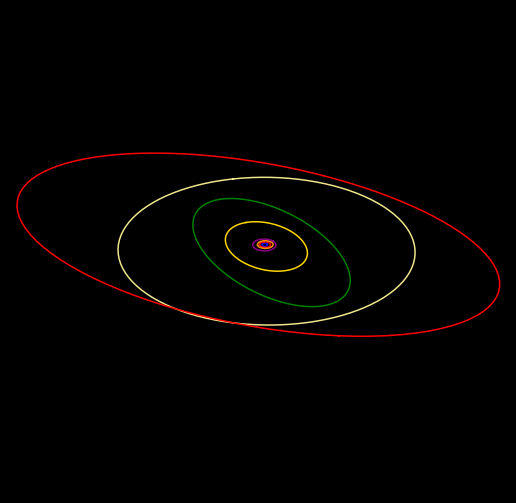

In [ ]:
#Graficando los orbitas de los planetas

fig=plt.figure(figsize=(9,9))
Col=['b','r','darkorange','darkmagenta','gold','g','khaki','r']
ax=fig.add_subplot(111,projection='3d')
for i in range(len(pl)):
    ax.plot(xt[:,i],yt[:,i],zt[:,i], color=Col[i])
max=LA.norm(r[7])/1.7
ax.set_xlim((-max,max))
ax.set_ylim((-max,max))
ax.set_zlim((-max,max))


#Quita los ejes
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.spines['top'].set_color('k')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])


#Sistema solar considerando la ineteraccion de todos los planetas


**Ineracción con los demas Planetas**

Como cada Planeta ejerce gravedad sobre los demas, es nesesario considerar este como un problema de $N$ cuerpos, con el sol en el centro de coordenadas, este problema se tiene que resolver numericamente, para lo cual es bueno definir un conjunto de unidades que nos faciliten el problema, $`` \textit{unidades canonicas}"$.

El sistema $\texttt{Solar}$ tiene los siguientes datos:
\begin{eqnarray}
&&\textit{Sistema internacional} && \textit{Unidades canónicas}\\
\\
m_{\oplus}&=&5.98\times 10^{24}\mbox{kg}&=&3.01616\times10^{-11} \, &\textit{Masa de la Tierra}\\
M_{\odot}&=&1.98\times 10^{30}\mbox{kg}&=&U_m\, &\textit{Masa de la Sol}\\
G&=&6.67\times 10^{-11}\mbox{m}^3/\mbox{km s}^2&=&1\, &\textit{Constante de Cavendish}\\
a&=&1.5\times 10^{11}\mbox{m}&=&U_l\, &\textit{Distancia Tierra-Sol}\\
t&=&\sqrt{\frac{U_l^3}{GU_m}}&=&U_t\, & \textit{Unidadde tiempo}
\end{eqnarray}

In [ ]:
#unidades canonicas
Ul=1.5e11
Um=Ms
Ut=np.sqrt(Ul**3/(G*Um))
pl[2]['m']/Um

3.016161616161616e-06

In [ ]:
"""
Esta celda es para agregar la posición y las velocidades del Sol a las variables antes trabajadas
"""
pl2=[Mercurio,Venus,Tierra,Marte,Jupiter,Saturno,Urano,Neptuno]#palnetas
pl2.append(Sol)
############# Arreglos vacios de vector posición y velocidad ####################
rs=np.zeros((len(pl2),(3)))
vs=np.zeros((len(pl2),(3)))
############## Posiciones de los planetas #####################

xt=np.zeros((len(M),len(pl2)))#x de todos los planetas
yt=np.zeros((len(M),len(pl2)))#y de todos los planetas
zt=np.zeros((len(M),len(pl2)))#z de todos los planetas

for j in range(len(pl)):
  rs[j]=np.array([pl2[j]["X"],pl2[j]["Y"],pl2[j]["Z"]])*1000  #Vector posición del sistema en (m)
  vs[j]=np.array([pl2[j]["VX"],pl2[j]["VY"],pl2[j]["VZ"]])*1000   #Vector velocidad del sistema (m/s)


In [ ]:
sistema=dict(
        particula1=dict( 
            m=pl2[0]["m"]/Um,
            r=list(rs[0]/Ul),
            v=list(vs[0]*(Ut/Ul))
            ),
        particula2=dict(
             m=pl2[1]["m"]/Um,
             r=list(rs[1]/Ul),
             v=list(vs[1]*(Ut/Ul))
             ),
        particula3=dict(
             m=pl2[2]["m"]/Um,
             r=list(rs[2]/Ul),
             v=list(vs[2]*(Ut/Ul))
             ),
        particula4=dict(
             m=pl2[3]["m"]/Um,
             r=list(rs[3]/Ul),
             v=list(vs[3]*(Ut/Ul))
             ),
        particula5=dict(
             m=pl2[4]["m"]/Um,
             r=list(rs[4]/Ul),
             v=list(vs[4]*(Ut/Ul))
             ),
        particula6=dict( 
            m=pl2[5]["m"]/Um,
            r=list(rs[5]/Ul),
            v=list(vs[5]*(Ut/Ul))
            ),
        particula7=dict(
             m=pl2[6]["m"]/Um,
             r=list(rs[6]/Ul),
             v=list(vs[6]*(Ut/Ul))
             ),
        particula8=dict( 
            m=pl2[7]["m"]/Um,
            r=list(rs[7]/Ul),
            v=list(vs[7]*(Ut/Ul))
        ),
        particula9=dict( 
            m=pl2[8]["m"]/Um,
            r=list(rs[8]/Ul),
            v=list(vs[8]*(Ut/Ul))
            )
        )


In [ ]:
#Preparación de la solución
y,masas,N=sis2ini(sistema)
T=200.0
Nt=100.0
#Solución
solucion=odeint(EoM_Nbody,y,np.linspace(0,T,Nt),args=(masas,))
#Extracción de la solución
rs1,vs1=sol2pos(solucion)


(-29.801797518357457, 29.801797518357457)

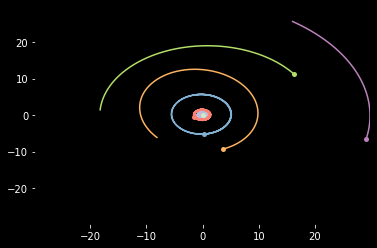

In [ ]:
fig2d = plt.figure()
ax2d=fig2d.gca()

for i in range(N):
    # Grafica en 2D
    line,=ax2d.plot(rs1[i,0,0],rs1[i,0,1],'o',markersize=5,markeredgecolor='none')
    color=line.get_color()
    ax2d.plot(rs1[i,:,0],rs1[i,:,1],color=color)
        
ext=np.abs(rs1[:,:,:2]).max()
ax2d.set_xlim(-ext,ext)
ax2d.set_ylim(-ext,ext)

[]

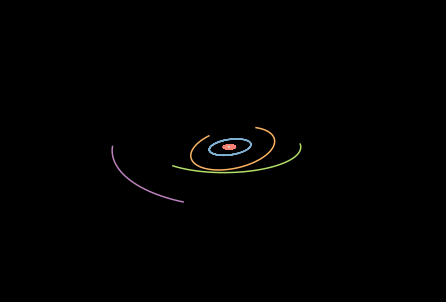

In [ ]:
# Graficar en 3D
fig3d = plt.figure()
ax3d=Axes3D(fig3d)

for i in range(N):
    line,=ax3d.plot(rs1[i,:,0],rs1[i,:,1],rs1[i,:,2])
    color=line.get_color()
        
ax3d.view_init(elev=30,azim=80)

ext=ext=np.abs(rs1).max()
ax3d.set_xlim(-ext,ext)
ax3d.set_ylim(-ext,ext)
ax3d.set_zlim(-ext,ext)
#Quita los ejes
ax3d.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.spines['top'].set_color('k')
ax3d.set_xticks([])
ax3d.set_yticks([])
ax3d.set_zticks([])

[]

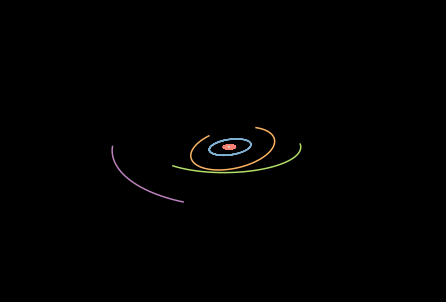

In [ ]:
# Graficar en 3D
fig3d = plt.figure()
ax3d=Axes3D(fig3d)

for i in range(N):
    line,=ax3d.plot(rs1[i,:,0],rs1[i,:,1],rs1[i,:,2])
    color=line.get_color()
        
ax3d.view_init(elev=30,azim=80)

ext=ext=np.abs(rs1).max()
ax3d.set_xlim(-ext,ext)
ax3d.set_ylim(-ext,ext)
ax3d.set_zlim(-ext,ext)
#Quita los ejes
ax3d.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax3d.spines['top'].set_color('k')
ax3d.set_xticks([])
ax3d.set_yticks([])
ax3d.set_zticks([])

# Conclusiones 
Como se puede ver en el modelo jerarquico y en el modelo de $N$ cuerpos, el sistema solar se comporta de forma similar sin cambios apreciables, esto se debe en parte a que la aproximacion jerarquica es muy buena, ya que el Sol tiene una masa muy grande comparada con los demas cuerpos del sistema solar, ademas las distancias entre los cuerpos es bastante grande, como para que estos afecten significativamente el movimiento de los demas

# Aumentando la masa de Júpiter  5 ,  10 ,  100  veces

Como es bastante demorado realizar la integración del sistema solar, Solo se va a tomar el caso mas extremo donde Jupiter tiene una masa $100$ veces mayor, lo cual nos permitira sacar conclusiones relevantes.

In [ ]:
sistema['particula5']['m']=sistema['particula5']['m']*100

In [ ]:
#Preparación de la solución
y,masas,N=sis2ini(sistema)
T=200.0
Nt=100.0
#Solución
solucion=odeint(EoM_Nbody,y,np.linspace(0,T,Nt),args=(masas,))
#Extracción de la solución
rs1,vs1=sol2pos(solucion)

(-29.72339004764719, 29.72339004764719)

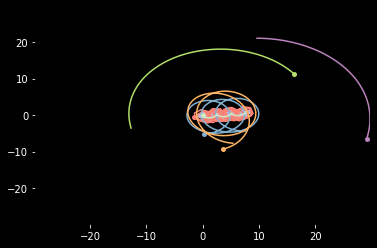

In [ ]:
fig2d = plt.figure()
ax2d=fig2d.gca()

for i in range(N):
    # Grafica en 2D
    line,=ax2d.plot(rs1[i,0,0],rs1[i,0,1],'o',markersize=5,markeredgecolor='none')
    color=line.get_color()
    ax2d.plot(rs1[i,:,0],rs1[i,:,1],color=color)
        
ext=(np.abs(rs1[:,:,:2]).max())
ax2d.set_xlim(-ext,ext)
ax2d.set_ylim(-ext,ext)

# Observando la orbita de Júpiter 
Para poder observar bien el efecto que tiene el aumento en la masa de Júpiter sobre el sistema solar, es necesario hacer un Zoom sobre su orbita, la cual esta identificada con el color azul.

(-5.944678009529438, 5.944678009529438)

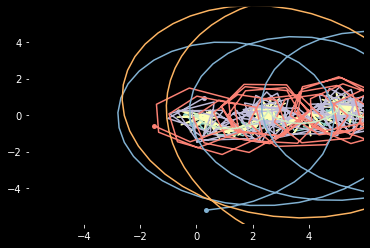

In [ ]:
fig2d = plt.figure()
ax2d=fig2d.gca()

for i in range(N):
    # Grafica en 2D
    line,=ax2d.plot(rs1[i,0,0],rs1[i,0,1],'o',markersize=5,markeredgecolor='none')
    color=line.get_color()
    ax2d.plot(rs1[i,:,0],rs1[i,:,1],color=color)
        
ext=(np.abs(rs1[:,:,:2]).max())/5.0
ax2d.set_xlim(-ext,ext)
ax2d.set_ylim(-ext,ext)

#Conclusiones 
En este gráfico, se puede observar como los planetas interiores son atraidos hacia Jupiter, ya que este al aunmetar su masa $100$ tendria una masa casi $10$ veces mayor que la del Sol, Los planetas como Marte, Tierra,Venus, y Saturno, se verian seriamente afectados por su gravedad. El sistema se tornaria inestable y muchos planetas chocarian o serian expulsados del sistema solar 

**2. Oscilador armónico $2D$** onsidere un oscilador armónico anisotrópico en dos dimensiones, con $m$ como la masa oscilante y $k_x$ y $k_y$ la constante elástica en dirección $x$ e $y$, respectivamente.

**a)** Encuentre el Hamiltoniano del sistema

**b)** Halle las ecuaciones de movimiento del sistema.

**c)** Considere ahora el caso isotrópico, con $k_x$ $= k_y$ $= k$. Escriba el Hamiltoniano de este nuevo sistema en coordenadas polares y encuentre las ecuaciones de movimiento.

**d)** Estudie la evolución del sistema para diferentes valores de la fase $(\delta = 0, \frac{\pi}{2} ,\frac{\pi}{4} , \frac{\pi}{6} ).$ Para ello realice gráficos de las diferentes variables y/o cantidades físicas (energía, momentum, etc.) en el tiempo ¿Qué cantidades se conservan? 


**e)** Con lo anterior, haga una animación que muestre cómo es el movimiento de la masa $m$ a lo largo del tiempo.


**Solución (2)**

Para encontrar a función $Lagrangiana$ es necesario encontrar primero la energía cinética y la energía potencial.

**Energía cinética T**
$$T=\frac{1}{2}mv^2=\frac{1}{2}m(\dot x^2+\dot y^2)$$

**Energía potencial U**
$$U=\frac{1}{2}k_x x^2+ \frac{1}{2}k_y y^2$$
El lagrangiano es:

**Lagrangiano**
$$L=\frac{1}{2}m(\dot x^2+\dot y^2)-\frac{1}{2}k_x x^2- \frac{1}{2}k_y y^2$$

Donde los momentos generalizados son $p_x=m\dot x$ y $p_y=m\dot y$
despejand la velocidad en función de los momentos y reemplazando en el $Lagrangiano$ obtenemos
$$L{qp}=\frac{1}{2m}(p_x^2+ p_y^2)-\frac{1}{2}k_x x^2- \frac{1}{2}k_y y^2$$

Como las variabeles no depende del tiempo y  el potencial no depende de las velocidades $H=T+U$

$$H=\frac{1}{2m}(p_x^2+ p_y^2)+\frac{1}{2}k_x x^2+\frac{1}{2}k_y y^2$$


**b)** Las ecuaciones de movimiento se logran por medio de  las ecuaciones canocicas de *Hamilton*
$$
\boxed{
\left\{
\begin{split}
\dot q_j & = & +\frac{\partial H}{\partial p_j}\\
\dot p_j & = & -\frac{\partial H}{\partial q_j}
\end{split}
\right\}_M}\qquad(2.2).
$$
Aplicando las ecuaciones $(2.2)$
\begin{eqnarray}
\begin{split}
\dot x & = & \frac{\partial H}{\partial p_x}&=&\frac{p_x}{m}\\
\dot y & = & \frac{\partial H}{\partial p_y}&=&\frac{p_y}{m}
\end{split}\qquad(2.3)
\end{eqnarray}
y para 

\begin{eqnarray}
\begin{split}
\dot p_x & = & - \frac{\partial H}{\partial x}&=&- k_x x\\
\dot p_y & = & - \frac{\partial H}{\partial y}&=& -k_y y
\end{split}\qquad(2.4)
\end{eqnarray}

Si derivamos las ecuaciones de la velocidad $(2.3)$ respecto al tiempo, y reemplazando en esta las ecuaciones $(2.4)$ obtenemos:


\begin{eqnarray}
\ddot x & = & \frac{d}{dt}\frac{\partial H}{\partial p_x}&=&\frac{\dot p_x}{m},\\
\ddot y & = & \frac{d}{dt}\frac{\partial H}{\partial p_y}&=&\frac{\dot p_y}{m},
\end{eqnarray}

\begin{eqnarray}
\boxed{
\begin{split}
\ddot x & = &\frac{-k_xx}{m}=-w_x^2x\\
\ddot y & = &\frac{-k_y y}{m}=-w_y^2 y
\end{split}
},
\end{eqnarray}
donde las frecuancias estan dadas por $w_x=\sqrt{\frac{k_x}{m}}$ y $w_y=\sqrt{\frac{k_y}{m}}$. Como estas frecuencias son diferentes el moviemento conjunto en $x$ y $y$ de un conjunto de trayectorias que podemos clasificar en base a las relaciones entre las frecuancias

$$x(t) = (p_x(0) sin(t ω_x))/(m ω_x) + x(0) cos(t ω_x)\\
p_x(t) = p_x(0) cos(t ω_x) - m x(0) ω_x sin(t ω_x)\\
y(t) = (p_y(0) sin(t ω_y))/(m ω_y) + y(0) cos(t ω_y)\\
p_y(t) = p_y(0) cos(t ω_y) - m y(0) ω_y sin(t ω_y)$$

**Solución del oscilador anisotropico**
$$
x(t) = (x'(0) sin(t ω_x))/ω_x + x(0) cos(t ω_x)\\
y(t) = (y'(0) sin(t ω_y))/ω_y + y(0) cos(t ω_y)
$$

Donde para un conjunto de condiciones de frontera, la solución se puede escribir de la siguiente forma.
\begin{eqnarray}
\begin{split}
x & = & A_x \cos (w_xt)\\
y & = & A_y \cos (w_yt-\delta)
\end{split}
\end{eqnarray}

**Trayectorias**
Al momento de Realizar las trayectorias del sistema es conveniente analisar tres casos.

>I. Cuando $k_x=k_y=k$ el oscilador se vuelve un oscilador isotropico, ya que las frecuencias angulares $w_x=w_y$ serian las mismas $``w"$ y las ecuaciones de movieminto serian  $$x=Acos(wt)\\y=Acos(wt)$$
lo que resultatria en una trayectoria recta.

>II. Cuando $\frac{w_x}{w_y}$ es un numero racional, en este caso el movimiento es periodico, y la trayectoria se conoce como figura de lissajous $w_x=\sqrt{2}w_y$ $$x=A_xcos(\sqrt{2}w_yt)\\y=A_ycos(w_yt-\delta)$$

>III. Si $\frac{w_x}{w_y}$ es un numero irracional, el movimiento es mucho mas complejo, ya que las treyectorias no son cerradas, aunque los movimientos son casi periodicos, esto quiere decir que los movimientos en $x$ y $y$ son periodicos, pero estos son incompatibles

# Caso I $w_x=w_y$

In [ ]:
#Constantes del problema
m=1.0 #kg 
ky=10
kx=10

In [ ]:
#Ecuacion Diferencial
def O_Anisotropico(y,t,m,kx,ky):
    x=y[0]
    y1=y[1]
    px=y[2]
    py=y[3]
    dxdt=y[2]/m
    dydt=y[3]/m
    dpxdt=y[0]*kx
    dpydt=y[1]*ky
    return [dxdt,dydt,dpxdt,dpydt]



In [ ]:
#Condiciones iniciales
y=[10,10.0,5.0,5.0]
ts=np.linspace(0,10.0,10000)

#solución
solucion=odeint(O_Anisotropico,y,ts,args=(m,kx,ky))


In [ ]:
#soluciones del sistema en componentes
x=solucion[:,0] # solución de x
y=solucion[:,1] # solución de y
px=solucion[:,2] # momento en x vx*m
py=solucion[:,3] # momento en y vy*m

In [ ]:
plt.style.use("classic")
import matplotlib
matplotlib.rc('axes',edgecolor='k')

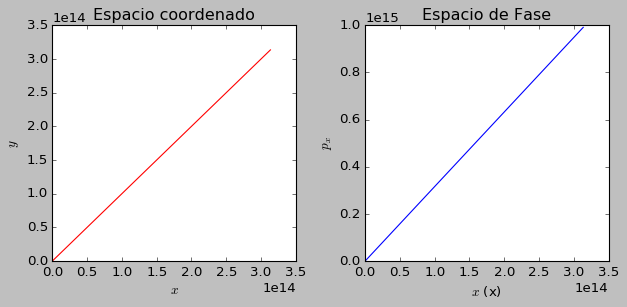

In [ ]:
fig,axs=plt.subplots(1,2,figsize=(8,4))

colors=np.array(['darkred.', 'k.', 'g', 'r-','b', 'k', 'r', 'g','b', 'k'])
    #Espacio coordenado
axs[0].plot(x,y,'-r')
axs[0].set_xlabel(r"$x$")
axs[0].set_ylabel(r"$y$")
axs[0].set_title("Espacio coordenado")

    #Espacio de Fase
axs[1].plot(x,px,colors[4])

axs[1].set_xlabel(r"$x$ (x)")
axs[1].set_ylabel(r"$p_x$")
axs[1].set_title("Espacio de Fase")
fig.tight_layout()
 

Para Graficar bien los diferentes casos, se va a llamar a la relacion $w_x/w_y=\alpha$, por tanto la trayectoria va a ser funcion de $\alpha$ y delta 

In [ ]:
################################################################
"""Oscilador anisotropico"""
################################################################

def oscilador(alpha,delta):
  A_x=1
  A_y=1.2
  wx=np.radians(32.0)
  wy=alpha*wx
  x_1=A_x*np.cos(wx*ts)
  y_1=A_y*np.cos(wy*ts-np.radians(delta))
  return x_1,y_1

#Caso II $w_x={2}w_y$ con $\alpha=2$ racional 

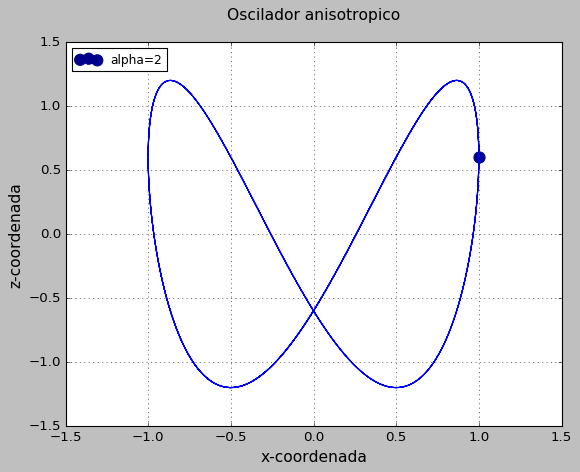

In [ ]:

alpha=2
delta=60 #Delta en grados
ts=np.linspace(0,50,1000)
x1,y1=oscilador(alpha,delta)


#Plot the orbits
plt.plot(x1,y1,color="blue")
#Plot the final positions of the stars
plt.scatter(x1[0],y1[0],color="darkblue",marker="o",s=100,label="alpha=2")
#Add a few more bells and whistles
plt.xlabel("x-coordenada",fontsize=14)
plt.ylabel("z-coordenada",fontsize=14)
plt.title("Oscilador anisotropico\n",fontsize=14)
plt.legend(loc="upper left",fontsize=11)
plt.grid()

#Caso III $w_x=\sqrt{2}w_y$ con $\alpha$ irracional 

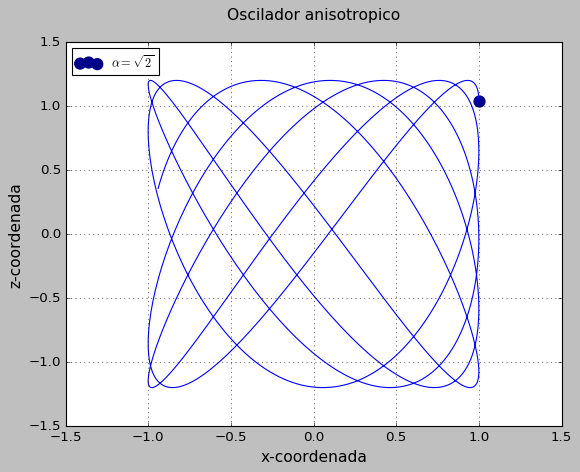

In [ ]:

alpha=np.sqrt(2)
delta=30 #Delta en grados
ts=np.linspace(0,50,1000)
x1,y1=oscilador(alpha,delta)


#Plot the orbits
plt.plot(x1,y1,color="blue")
#Plot the final positions of the stars
plt.scatter(x1[0],y1[0],color="darkblue",marker="o",s=100,label=r'$ \alpha =\sqrt{2}$')
#Add a few more bells and whistles
plt.xlabel("x-coordenada",fontsize=14)
plt.ylabel("z-coordenada",fontsize=14)
plt.title("Oscilador anisotropico\n",fontsize=14)
plt.legend(loc="upper left",fontsize=11)
plt.grid()

**c)** **Hamiltoniano en polares**
Para Hallar el Hamiltoniano se indica en el enucniado que $k_x=k_y=k$
$$H=\frac{1}{2m}(p_x^2+ p_y^2)+\frac{1}{2}k(x^2+ y^2).$$
Realizando un cambio de coordenadas a polares
$x=r\cos\theta$ y $y=r\sin(\theta)$ el lagraniano del sistema queda

**Lagrangiano en polares**
$$L=\frac{1}{2}m(\dot r^2+r^2\dot \theta^2)-\frac{1}{2}kr^2,$$
donde se pueden encontrar los momentos generalizados derivando el lagrangianon respecto a las coordenada $\dot r$ y $\dot \theta$
\begin{split}
p_r=\frac{\partial L}{\partial \dot r}=m\dot r,\\
p_\theta=\frac{\partial L}{\partial \dot \theta}=mr^2\dot\theta,
\end{split}

donde se puede observar que la variable $\theta$ es ciclica lo que indica que el momento en theta se conserva.
Despejando las velocidades en termino de los momentos 
\begin{split}
\dot r=\frac{p_r}{m},\\
\dot\theta=\frac{p_{\theta}}{mr^2}.
\end{split}
Con esto se puede encontrar el nuevo lagrangiano en termino de los momentos teniendo:
$$L{qp}=\frac{1}{2m}(p_r^2+ \frac{p_\theta^2}{r^2})-\frac{1}{2}kr^2.$$

Ahora si es posible encontrar el Hamintoniano usando nuevamente la definición anteriormente mencionada

$$H=\frac{1}{2m}(p_r^2+ \frac{p_\theta^2}{r^2})+\frac{1}{2}kr^2$$

Las ecuaciones de moviento son :
\begin{eqnarray}
\begin{split}
\dot r & = & \frac{\partial H}{\partial p_r}&=&\frac{p_r}{m}\\
\dot \theta & = & \frac{\partial H}{\partial p_{\theta}}&=&\frac{p_\theta}{mr^2}
\end{split}\qquad(2.5)
\end{eqnarray}
y para 

\begin{eqnarray}
\begin{split}
\dot p_r & = & - \frac{\partial H}{\partial r}&=&\frac{p_{\theta}^2}{mr^3}-kr\\
\dot p_{\theta} & = & - \frac{\partial H}{\partial \theta}&=& 0
\end{split}\qquad(2.6)
\end{eqnarray}

$P_{\theta}$ es una costante a la que llamaremos $l=mr^2w$ o ``*momento angular*" por tanto la ecuación de movimietno para $r$ queda de la siguiente manera.

Derivando $(2.5)$ tenemos que: 
\begin{eqnarray}
\begin{split}
\ddot r & = & \frac{\dot p_r}{m}\\
\textit{y reemplazando } \dot p_r\, \textit{tenemos}\\
\ddot r & = & \frac{ p_{\theta}^2}{m^2r^3}-\frac{k}{m}r\\
\textit{y reemplazando $p_{\theta}^2$ por $l$ optenemos }\\
\ddot r & = & \frac{ l^2}{m^2r^3}-\frac{k}{m}r\\
\end{split}
\end{eqnarray}


**d)** para valores de $\delta=0,30,45,90$ las trayectorias recorridas por los cuerpos e puede ver en el siguiente grafico

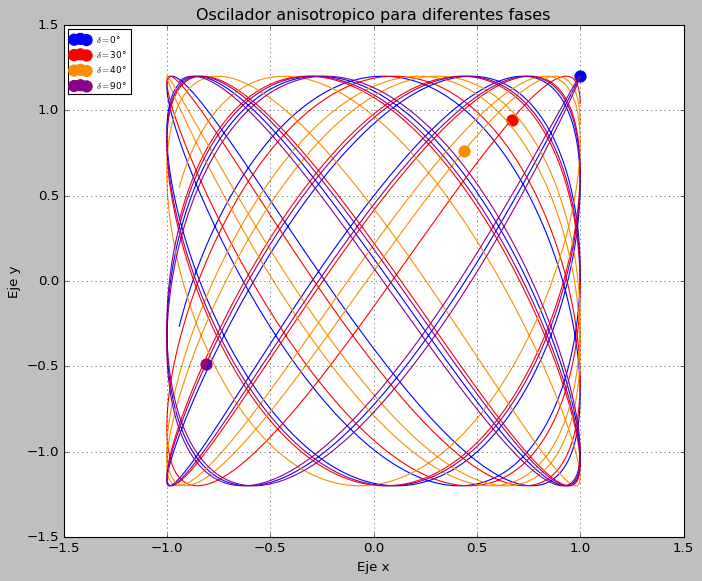

In [ ]:
delta=(0,30,40,90)
plt.figure(figsize=(10, 8))
for i in range(len(delta)):
  x1,y1=oscilador(alpha,delta[i])
  plt.plot(x1,y1,color=Col[i])
  plt.scatter(x1[delta[i]],y1[delta[i]],color=Col[i],marker="o",s=100,label=r'$ \delta =$'+str(delta[i])+"°")
  plt.title('Oscilador anisotropico para diferentes fases')
  plt.xlabel("Eje x")
  plt.ylabel("Eje y")
plt.grid()
plt.legend(loc="upper left",fontsize=8)

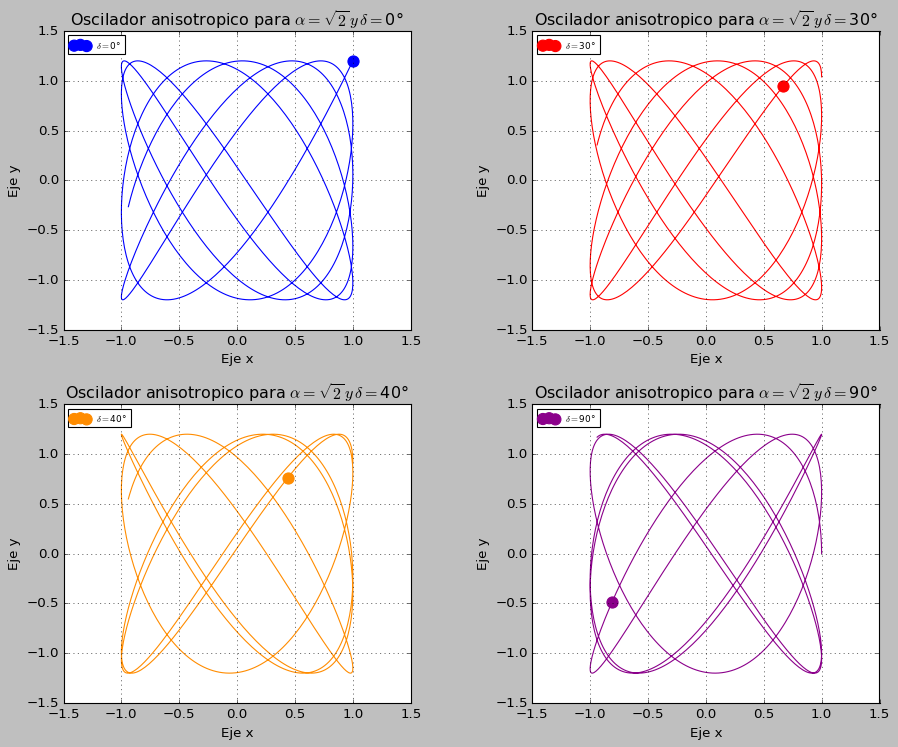

In [ ]:
 plt.figure(figsize=(12, 10))
 for i in range(len(delta)):
    plt.subplot(2,2,(i+1))
    x1,y1=oscilador(alpha,delta[i])
    plt.plot(x1,y1,color=Col[i])
    plt.scatter(x1[delta[i]],y1[delta[i]],color=Col[i],marker="o",s=100,label=r'$ \delta =$'+str(delta[i])+"°")
    plt.title('Oscilador anisotropico para 'r'$ \alpha =\sqrt{2}\, y \, \delta=$'+str(delta[i])+"°")
    plt.xlabel("Eje x")
    plt.ylabel("Eje y")
    plt.grid(True)
    plt.legend(loc="upper left",fontsize=8)

plt.gca().yaxis.set_minor_formatter(NullFormatter())

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.25,
                    wspace=0.35)


#Animación

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
x1,y1=oscilador(alpha,delta[1])
ts=np.linspace(0,50,300)
t = np.linspace(0,2*np.pi)
x = np.sin(t)
fig = plt.figure(figsize=(6, 6))
plt.close()
ax = fig.add_subplot(111, autoscale_on=False, xlim=(-2,2), ylim=(-2,2))
ax.set_title("Oscilador anisotropico")
ax.set_xlabel("Eje x")
ax.set_ylabel("Eje y")
l, = ax.plot([],[])

def animate(i):
    
    l.set_data(x1[:i], y1[:i])
    
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(ts),init_func=None, fargs=None, save_count=None, interval=20)

from IPython.display import HTML
HTML(ani.to_jshtml())